In [1]:
%load_ext autoreload
%autoreload 2

In [12]:
%matplotlib inline

In [3]:
import paderbox as pb

In [4]:
from collections import defaultdict
import itertools
from mms_msg.visualization.plot import plot_mixture
from mms_msg import keys
from mms_msg.simulation.utils import load_audio
        
def plot_mixtures(generator_dataset, number=6, columns=3, figure_width=10):
    with pb.visualization.axes_context(columns=columns, figure_size=(figure_width, 3)) as ac:
        for ex in itertools.islice(generator_dataset, number):
            plot_mixture(ex, ac.new)
            # activity = defaultdict(pb.array.interval.zeros)
            # num_samples = pb.utils.nested.get_by_path(ex, 'num_samples.original_source', allow_early_stopping=True)
            # for o, l, s in zip(ex['offset']['original_source'], num_samples, ex['speaker_id']):
            #     activity[s][o:o+l] = True
            #
            # pb.visualization.plot.activity(activity, ax=ac.new)

In [5]:
import mms_msg
from mms_msg import sampling

## Preparation: The input dataset
The mixture/meeting generators are generic, i.e., they work with any database that contains examples of single-speaker speech.
The input database has to have its examples in the correct format, i.e., they have to contain the correct keys.

The examples have to have the following format:
 - `example_id` (`str`): The ID of the input example. Has to be unique in the input dataset
 - `num_samples` or `num_samples.observation` (`int`): The number of samples in the example
 - `speaker_id` (`str`): The ID of the speaker that uttered the speech in this example
 - `audio_path` or `audio_path.observation` (`str`): The path to the audio, will later be in `audio_path.original_source`
 
For meeting data additionally:
 - `scenario` (`str`): An identifier that uniquely identifies a "scenario" that should not change for a single speaker in a meeting. E.g., in LibriSpeech the scenario should be `f"{chapter_id}_{speaker_id}"`. Defaults to `speaker_id`.

All other keys are simply copied over from the input examples, so all information present in the input examples will be present in the generated mixtures.

In [6]:
# Prepare input datasets: VPC test data
from mms_msg.databases.single_speaker.vpc.database import VPC
input_db = VPC()
input_ds = input_db.get_dataset('vctk_test')
input_ds[0]

{'audio_path': {'observation': '/media/Daten/datasets/VPC/vctk_test/wav/p225/p225_001_mic2.wav'},
 'gender': 'female',
 'num_samples': 32824,
 'speaker_id': 'p225',
 'transcription': 'PLEASE CALL STELLA',
 'example_id': 'p225_001_mic2',
 'dataset': 'vctk_test'}

## Fully overlapped mixtures

### Like WSJ0-2mix

In [8]:
# Deterministic, anechoic, no offset, like WSJ0-2mix

# Compute a composition of base examples. This makes sure that the speaker distribution
# in the mixtures is equal to the speaker distribution in the original database.
ds = sampling.source_composition.get_composition_dataset(input_dataset=input_ds, num_speakers=2)

# If required: Offset the utterances
ds = ds.map(sampling.pattern.classical.ConstantOffsetSampler(0))

# If required: Add log_weights to simulate volume differences
ds = ds.map(sampling.environment.scaling.UniformScalingSampler(max_weight=5))

# If required: Truncate to the shorter utterance
ds = ds.map(mms_msg.simulation.truncation.truncate_min)

len(ds), ds[0]

(12350,
 {'audio_path': {'original_source': ['/media/Daten/datasets/VPC/vctk_test/wav/p258/p258_221_mic2.wav',
    '/media/Daten/datasets/VPC/vctk_test/wav/p259/p259_206_mic2.wav']},
  'gender': ['male', 'male'],
  'num_samples': {'original_source': [60270, 50012], 'observation': 50012},
  'speaker_id': ['p258', 'p259'],
  'transcription': ['HE SAID THAT HEALTHY EATING WAS HIGH ON THE COUNCIL AGENDA',
   'IN DUE COURSE WE WILL MAKE AN ANNOUNCEMENT'],
  'example_id': '0_p258_221_mic2_p259_206_mic2',
  'dataset': 'vctk_test',
  'scenario': ['p258', 'p259'],
  'num_speakers': 2,
  'source_dataset': ['vctk_test', 'vctk_test'],
  'source_id': ['p258_221_mic2', 'p259_206_mic2'],
  'offset': {'original_source': [0, 0]},
  'log_weights': [1.9752497468983372, -1.9752497468983372],
  'start': 0,
  'stop': 50012,
  'source_example_id': '0_p258_221_mic2_p259_206_mic2'})

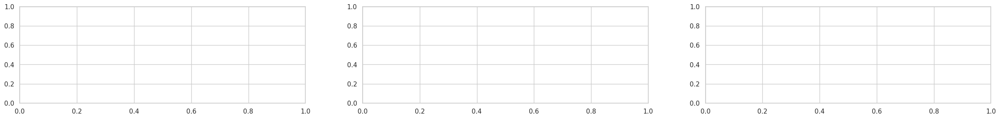

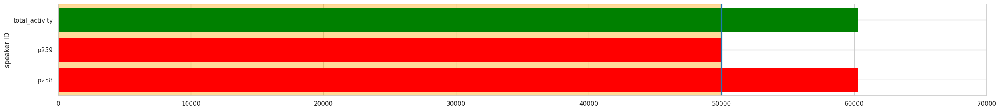

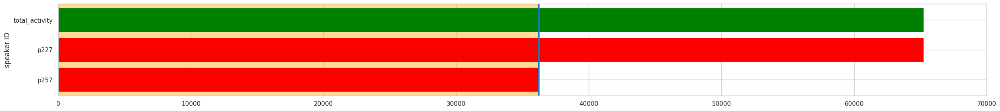

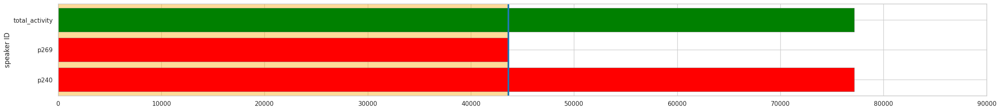

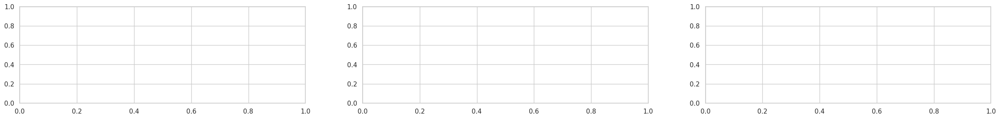

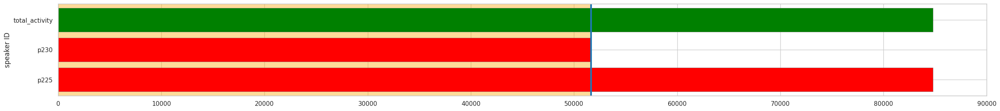

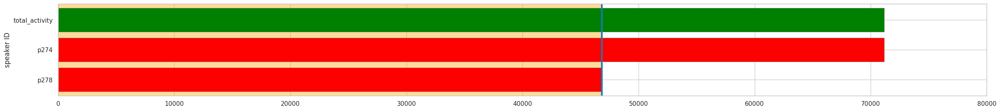

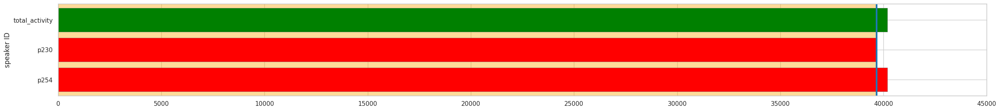

In [14]:
plot_mixtures(ds)

In [16]:
# Load audio
from mms_msg import keys
ds = ds\
    .map(lambda example: load_audio(example, keys.ORIGINAL_SOURCE))\
    .map(mms_msg.simulation.anechoic.anechoic_scenario_map_fn)
ex = ds[0]
pb.io.play(ex['audio_data']['observation'], sample_rate=16000)

## Generate Meetings

### Anechoic

In [17]:
# Deterministic, anechoic, use the same base function as for SMS-WSJ, i.e., we have the same initial examples as SMS-WSJ
ds = sampling.source_composition.get_composition_dataset(input_dataset=input_ds, num_speakers=[3, 4])
ds = ds.map(sampling.environment.scaling.UniformScalingSampler(max_weight=5))
ds = ds.map(mms_msg.sampling.pattern.meeting.MeetingSampler(
    duration=5*60*16000, # in samples
    overlap_sampler=mms_msg.sampling.pattern.meeting.overlap_sampler.UniformOverlapSampler(
        max_concurrent_spk=2,
        p_silence=0.1,
        minimum_silence=0, # in samples
        maximum_silence=3*16000, # in samples
        # minimum_overlap=0, # in samples
        maximum_overlap=16000, # in samples
    ))(input_ds))
ds[0]

{'audio_path': {'original_source': ['/media/Daten/datasets/VPC/vctk_test/wav/p258/p258_221_mic2.wav',
   '/media/Daten/datasets/VPC/vctk_test/wav/p259/p259_206_mic2.wav',
   '/media/Daten/datasets/VPC/vctk_test/wav/p229/p229_157_mic2.wav',
   '/media/Daten/datasets/VPC/vctk_test/wav/p225/p225_118_mic2.wav',
   '/media/Daten/datasets/VPC/vctk_test/wav/p259/p259_462_mic2.wav',
   '/media/Daten/datasets/VPC/vctk_test/wav/p225/p225_298_mic2.wav',
   '/media/Daten/datasets/VPC/vctk_test/wav/p229/p229_277_mic2.wav',
   '/media/Daten/datasets/VPC/vctk_test/wav/p259/p259_391_mic2.wav',
   '/media/Daten/datasets/VPC/vctk_test/wav/p225/p225_113_mic2.wav',
   '/media/Daten/datasets/VPC/vctk_test/wav/p258/p258_089_mic2.wav',
   '/media/Daten/datasets/VPC/vctk_test/wav/p258/p258_182_mic2.wav',
   '/media/Daten/datasets/VPC/vctk_test/wav/p259/p259_363_mic2.wav',
   '/media/Daten/datasets/VPC/vctk_test/wav/p225/p225_212_mic2.wav',
   '/media/Daten/datasets/VPC/vctk_test/wav/p258/p258_406_mic2.wav',
 

In [19]:
# Load an example
from mms_msg import keys
ds = ds\
    .map(lambda example: load_audio(example, keys.ORIGINAL_SOURCE))\
    .map(mms_msg.simulation.anechoic.anechoic_scenario_map_fn)
ex = ds[0]
pb.io.play(ex['audio_data']['observation'], sample_rate=16000)

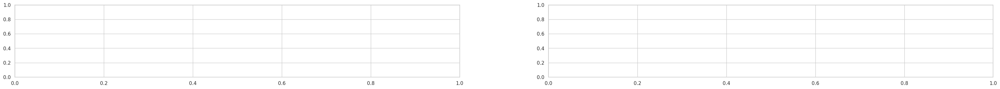

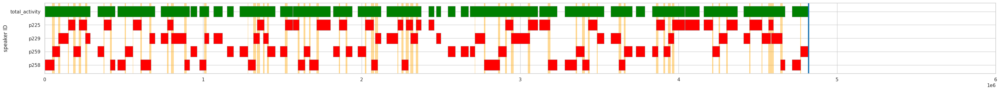

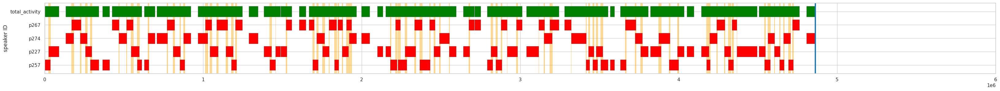

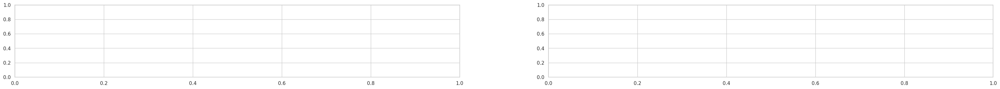

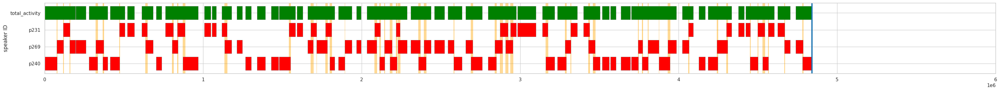

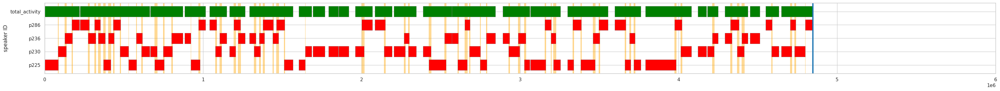

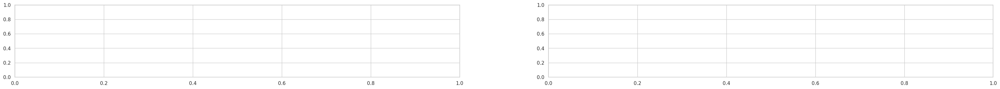

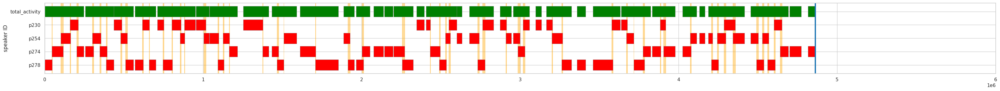

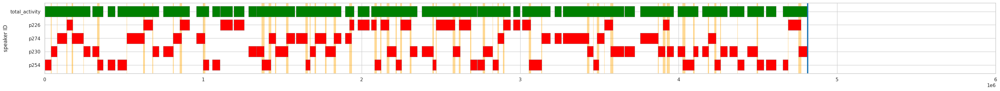

In [18]:
plot_mixtures(ds, columns=2, figure_width=20, number=6)

## Class-based interface

In [ ]:
db = mms_msg.databases.classical.full_overlap.Libri2MixClean()

In [ ]:
# Dataset names are the same as LibriSpeech
db.dataset_names

In [ ]:
plot_mixtures(db.get_dataset('test_clean'), number=3)

In [ ]:
# Dynamic mixing can be enabled by appending "_rng" (for a random seed) or "_rng<seed>" (for a fixed seed) to the dataset name.
# The top two potted rows are different because the seed is random by default
# The bottom two plotted rows are equal because the seed is fixed to 42
plot_mixtures(db.get_dataset('train_clean_100_rng'), number=3)
plot_mixtures(db.get_dataset('train_clean_100_rng'), number=3)
plot_mixtures(db.get_dataset('train_clean_100_rng42'), number=3)
plot_mixtures(db.get_dataset('train_clean_100_rng42'), number=3)

In [ ]:
# Audio can be loaded with the `load_example` method of the database object
ex = db.load_example(db.get_dataset('test_clean')[0])
pb.io.play(ex['audio_data']['observation'], name='observation')
pb.io.play(ex['audio_data']['speech_image'][0], name='speech_image 1')
pb.io.play(ex['audio_data']['speech_image'][1], name='speech_image 2')

## Generate JSON
A JSON file that contains the hyperparameters and can be read with a `lazy_dataset.JSONDatabase` object can easily be created by iterating over the dataset.
If you want to dump all generated signals as audio files, refer to TODO

In [ ]:
from tqdm.notebook import tqdm
database_dict = {'datasets': {dataset_name: dict(tqdm(db.get_dataset(dataset_name).items(), desc=dataset_name)) for dataset_name in db.dataset_names}}
pb.io.dump(database_dict, 'libri_mix.json')